<div align="center"><FONT FACE="times new roman" SIZE=5>
<img src="https://raw.githubusercontent.com/CamiloHedzz/ProcesamientoImagenes/main/LogoUSA.png"></img>
<div align="center"><FONT FACE="times new roman" SIZE=5>
    <i><b>Docente:</b></i> Camilo Rodriguez<br>
    <i><b>Asignatura:</b></i> Aprendizaje Maquina<br>
    <i><b>Tema:</b></i> Tercer Parcial<br>
    <i><b>Estudiantes: </b></i>Camilo Hernandez, Juan Arias, Christian Jimenez<br>
</div>

In [ ]:
#Se importan las bibliotecas necesarias
import numpy as np

#Mostar y tratar las imagenes
import requests
from PIL import Image
import seaborn as sns
import plotly.graph_objects as go
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots

#El modelo VGG16
import keras
import tensorflow as tf
from keras.layers import MaxPooling2D
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions

<h2><b>Contexto ¿Qué es VGG-16?</b></h2>

<p align='Justify'>
  <a href = 'https://es.mathworks.com/help/deeplearning/ref/vgg16.html'>
    VGG-16
  </a> es una red neuronal convolucional con 16 capas de profundidad. La entrada de VGG se establece en una imagen RGB de tamaño 224x244. El valor RGB promedio se calcula para todas las imágenes en la imagen del conjunto de entrenamiento y luego la imagen se ingresa como una entrada a la red de convolución VGG. Se utiliza un filtro 3x3 o 1x1 y el paso de convolución es fijo. <b>Esta imagen es lo mejor que pudimos haber encontrado</b>
</p>

<img src='https://raw.githubusercontent.com/blurred-machine/Data-Science/master/Deep%20Learning%20SOTA/img/config3.jpg'></img>

<p align='Justify'>
El propósito principal de VGG16 es la clasificación de imágenes. Se entrenó originalmente en el conjunto de datos ImageNet, que contiene millones de imágenes etiquetadas en diferentes categorías. VGG16 aprende a extraer características de una imagen y utilizar estas características para clasificarla en una de las categorías previamente definidas.</p>

In [ ]:
'''
Como este proceso se va a realizar tres veces
Se decide hacer una función que nos haga el proceso.
'''
model1 = VGG16()

def modelVGG(url):

  #El tamaño de la entrada de imagen de la red es de 224 por 224.
  img1 = keras.utils.image_utils.load_img(url, target_size=(224, 224),
                                       keep_aspect_ratio=True)

  img1 = keras.utils.img_to_array(img1)

  #Se escala la imagen y se indica los canales de la imagen
  img1 = img1.reshape(1, 224, 224, 3)

  img1 = preprocess_input(img1)

  return img1

In [ ]:
url1 = '/content/drive/MyDrive/Colab Notebooks/Octavo Semestre/Procesemiento de Imagenes/ImagenesCorte3T1/decors_00.jpg'
img1 = modelVGG(url1)

In [ ]:
#Demostrando lo anterior
model1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

# **Punto A: Cargar 3 imágenes.**
---



## **Probabilidades Imagen 1**

In [ ]:
imagen1 = Image.open(url1)

In [ ]:
#Se definen las dimensiones para la imagen.
imagen1 = np.asarray(imagen1)
wid, hgt = imagen1.shape[1], imagen1.shape[0]
print("Ancho de la imagen: ", wid)
print("Alto de la imagen: ", hgt)

Ancho de la imagen:  800
Alto de la imagen:  509


<h3><b>Descripción</b></h3>
<p align='Justify'>
<b>Esta imagen es del profesor Darwin del curso de procesamiento de imagenes, la voy a utilizar nuevamente en honor a el.</b> Los canales de esta imagen son RGB y a simple vista se ve el interior de una casa en medio del bosque. El interior de la casa parece ser el balcon.
</p>

In [ ]:
fig = go.Figure()

fig.update_layout(
    title={
        'text':'Casa en el campo',
        'x':0.5},
        width=wid/1.5,
        height=hgt/1.5,
        margin= dict(l=0, r=0, t=50, b=0)
)

fig.add_trace(go.Image(z=imagen1))

fig.show()

In [ ]:
img1 = modelVGG(url1)

In [ ]:
#Se obtiene el indice con mayor probabilidad
np.argmax(model1.predict(img1))

1/1 [==============================] - 1s 761ms/step


449

In [ ]:
#Se obtiene la maxima predicción
np.max(model1.predict(img1))

1/1 [==============================] - 1s 538ms/step


0.24964984

<h2><b>Se obtienen las probabilidades</b></h2>

<p align= 'Justify'>
Como se puede observar, la clase <b>Boathouse</b> tiene la probabilidad mas alta con el <b>27%</b>, que traducida vendria siendo como casabote o cobertizo, se podria decir que la clasificación es correcta, a pesar de no tener una probabilidad tan alta y que claramente la imagen tiene gran cantidad de información, es decir que no representa un unico objeto en concreto. Y es curioso que la segunda mayor porbabilidad corresponde a una barandilla.
</p>

In [ ]:
decode_predictions(model1.predict(img1), top=5)

1/1 [==============================] - 0s 438ms/step


[[('n02859443', 'boathouse', 0.24964984),
  ('n02793495', 'barn', 0.11373544),
  ('n03697007', 'lumbermill', 0.073000476),
  ('n04417672', 'thatch', 0.061550297),
  ('n04604644', 'worm_fence', 0.0582299)]]

## **Probabilidades Imagen 2**

In [ ]:
url2 = '/content/drive/MyDrive/Colab Notebooks/Octavo Semestre/Procesemiento de Imagenes/ImagesTransformaciones/la-scapigliata-da-vinci.jpg'

In [ ]:
imagen2 = Image.open(url2)

In [ ]:
#Se definen las dimensiones para la imagen.
imagen2 = np.asarray(imagen2)
wid2, hgt2 = imagen2.shape[1], imagen2.shape[0]
print("Ancho de la imagen: ", wid2)
print("Alto de la imagen: ", hgt2)

Ancho de la imagen:  404
Alto de la imagen:  450


<h3><b>Descripción</b></h3>
<p align='Justify'>
<a href = 'https://es.wikipedia.org/wiki/Cabeza_de_muchacha_%28Leonardo%29'>Esta Cabeza de muchacha</a>, conocida como La despeinada (en italiano, Testa di fanciulla (La scapigliata)) es una obra del pintor renacentista italiano Leonardo da Vinci. Está pintado con tierra oscura, ámbar verdoso y albayalde sobre tabla y mide 24,7 cm de alto y 21 cm de ancho. Está datada hacia 1508. Se conserva en la Galería Nacional de Parma en Italia.
</p>

In [ ]:
fig = go.Figure()

fig.update_layout(
    title={
        'text':'Imagen Original',
        'x':0.5},
        width=wid2,
        height=hgt2,
        margin= dict(l=0, r=0, t=50, b=0)
)

fig.add_trace(go.Image(z=imagen2))

fig.show()

<h2><b>Se define el modelo</b></h2>

In [ ]:
img2 = modelVGG(url2)

In [ ]:
#Se obtiene el indice con mayor probabilidad
np.argmax(model1.predict(img2))

1/1 [==============================] - 0s 497ms/step


921

In [ ]:
#Se obtiene la maxima predicción
np.max(model1.predict(img2))

1/1 [==============================] - 0s 463ms/step


0.45049646

<h2><b>Se obtienen las probabilidades</b></h2>

<p align= 'Justify'>
<b>Cobertura de libro?</b> Bueno, aqui el modelo se descacho un poco, pero tambien es por la imagen que se eligió, a pesar de ser a primera vista una mujer, por la textura de la imagen posiblemente fue la razón de esta clasificación. A diferencia de la anterior imagen esta tiene un <b>45%</b> de probabilidad de ser de la clase book_jacket.
</p>

In [ ]:
decode_predictions(model1.predict(img2), top=5)

1/1 [==============================] - 0s 423ms/step


[[('n07248320', 'book_jacket', 0.45049646),
  ('n04584207', 'wig', 0.025222275),
  ('n03998194', 'prayer_rug', 0.022506721),
  ('n03724870', 'mask', 0.021211725),
  ('n03929855', 'pickelhaube', 0.019202977)]]

## **Probabilidades Imagen 3**

In [ ]:
url3 = "https://http2.mlstatic.com/D_NQ_NP_868343-CBT46272813685_062021-O.jpg"

response = requests.get(url3, stream=True)
response.raise_for_status()

imagen3 = Image.open(response.raw)

In [ ]:
#Se definen las dimensiones para la imagen.
imagen3 = np.asarray(imagen3)
wid2, hgt2 = imagen3.shape[1], imagen3.shape[0]
print("Ancho de la imagen: ", wid2)
print("Alto de la imagen: ", hgt2)

Ancho de la imagen:  500
Alto de la imagen:  500


<h3><b>Descripción</b></h3>
<p align='Justify'>
La imagen muestra un balón de fútbol con un diseño clásico de paneles en blanco y negro. El balón tiene un aspecto redondo y está hecho de material resistente. Los paneles blancos y negros están claramente definidos y se entrelazan para formar la estructura del balón. Se pueden apreciar detalles como costuras o texturas en la superficie del balón. El fondo es de color blanco, lo que resalta aún más la apariencia contrastante del balón. En general, la imagen transmite la imagen icónica de un balón de fútbol reconocible al instante.
</p>


In [ ]:
fig = go.Figure()

fig.update_layout(
    title={
        'text':'Balon de futbol',
        'x':0.5},
        width=wid2,
        height=hgt2,
        margin= dict(l=0, r=0, t=50, b=0)
)

fig.add_trace(go.Image(z=imagen3))

fig.show()

<h2><b>Se define el modelo</b></h2>

In [ ]:
!wget https://http2.mlstatic.com/D_NQ_NP_856166-CBT46272813682_062021-O.webp

url3 = '/content/D_NQ_NP_856166-CBT46272813682_062021-O.webp'
img3 = modelVGG(url3)

--2023-05-26 05:38:22--  https://http2.mlstatic.com/D_NQ_NP_856166-CBT46272813682_062021-O.webp
Resolving http2.mlstatic.com (http2.mlstatic.com)... 23.12.145.30, 23.12.145.5, 23.12.145.8, ...
Connecting to http2.mlstatic.com (http2.mlstatic.com)|23.12.145.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11428 (11K) [image/webp]
Saving to: ‘D_NQ_NP_856166-CBT46272813682_062021-O.webp.1’

D_NQ_NP_856166-CBT4 100%[===================>]  11.16K  --.-KB/s    in 0s      

Last-modified header invalid -- time-stamp ignored.
2023-05-26 05:38:22 (50.1 MB/s) - ‘D_NQ_NP_856166-CBT46272813682_062021-O.webp.1’ saved [11428/11428]



In [ ]:
#Se obtiene el indice con mayor probabilidad
np.argmax(model1.predict(img3))

1/1 [==============================] - 1s 744ms/step


805

In [ ]:
#Se obtiene la maxima predicción
np.max(model1.predict(img3))

1/1 [==============================] - 1s 600ms/step


0.9999844

<h2><b>Se obtienen las probabilidades</b></h2>

<p align= 'Justify'>
Para este tercer caso, se obtiene una predicción con una probabilidad igual a uno. Según el modelo, se tiene una probabilidad del <b>99%</b> de ser un balón de futbol. Claramente, esto nos demuestra que el modelo vgg16 es acertado al momento de hacer predicciones sobre objetos cocretos. Sin embargo pierde fidelidad al momento de predecir imagenes con mucha información
</p>

In [ ]:
decode_predictions(model1.predict(img3), top=5)

1/1 [==============================] - 1s 582ms/step


[[('n04254680', 'soccer_ball', 0.9999844),
  ('n04540053', 'volleyball', 1.5417081e-05),
  ('n03530642', 'honeycomb', 9.582336e-08),
  ('n03255030', 'dumbbell', 2.1343432e-08),
  ('n02790996', 'barbell', 1.33620865e-08)]]

<h2><b>RESUMEN</b></h2>

Se muestran el top tres de probabilidades para cada imagen.

1/1 [==============================] - 0s 400ms/step


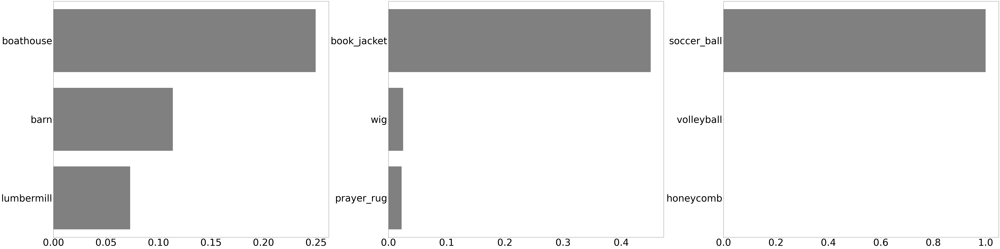

In [ ]:
imgs = [img1, img2, img3]
f, axes = plt.subplots(1, 3)
f.set_size_inches(80, 20)
for i, img_path in enumerate(imgs):
    preds  = decode_predictions(model1.predict(img_path), top=3)[0]
    b = sns.barplot(y=[c[1] for c in preds], x=[c[2] for c in preds], color="gray", ax=axes[i])
    b.tick_params(labelsize=55)
    f.tight_layout()

# **Punto B: Encontrar los 64 filtros.**
---

In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/2/24/Guitar_1.jpg

url4 = "/content/Guitar_1.jpg"

img4 = modelVGG(url4)

--2023-05-26 05:38:27--  https://upload.wikimedia.org/wikipedia/commons/2/24/Guitar_1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 292923 (286K) [image/jpeg]
Saving to: ‘Guitar_1.jpg.1’

Guitar_1.jpg.1      100%[===================>] 286.06K  --.-KB/s    in 0.01s   

2023-05-26 05:38:28 (24.4 MB/s) - ‘Guitar_1.jpg.1’ saved [292923/292923]



In [ ]:
'''
Esta es la capa 0, es decir que corresponde a la carga de la imagen.
Como es el imput para la imagen, pues no se retornara nada. Esto es importante
porque para sacar la capa 2 tenemos que tener en cuenta que sale y que entra para
cada capa. En esta parte no tanto, pero lo ponemos para ir contextualizando.
'''
print(model1.layers[0].input)
print(model1.layers[0].output)

KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_3'), name='input_3', description="created by layer 'input_3'")
KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_3'), name='input_3', description="created by layer 'input_3'")


In [ ]:
#Realmente, esta es la capa 2 pero en la 1 (model.layer[0]) No tenemos información
layer_1 = model1.layers[1]

In [ ]:
'''
En la convolución, un filtro se aplica a una región de la imagen de entrada.
En este caso, la forma [3, 3] significa que el filtro tiene una altura de 3
y una anchura de 3. Esto implica que el filtro se desliza por la imagen con
un tamaño de 3x3 píxeles.
'''
layer_1.weights[0][0][:, :, 0].shape

TensorShape([3, 3])

In [ ]:
layer_1.get_weights()[0].shape

(3, 3, 3, 64)

In [ ]:
layer_1.convolution_op(inputs=img4, kernel=layer_1.get_weights()[0]).shape

TensorShape([1, 224, 224, 64])

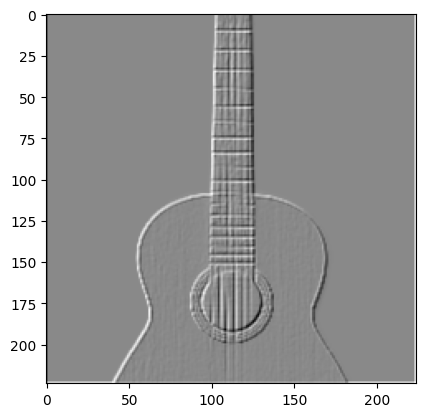

In [ ]:
#Se muestra el filtro uno de la capa uno
layer_1conv = layer_1.convolution_op(inputs=img4, kernel=layer_1.get_weights()[0])[0]
plt.imshow(layer_1conv[:, :, 0], cmap='gray')
plt.show()

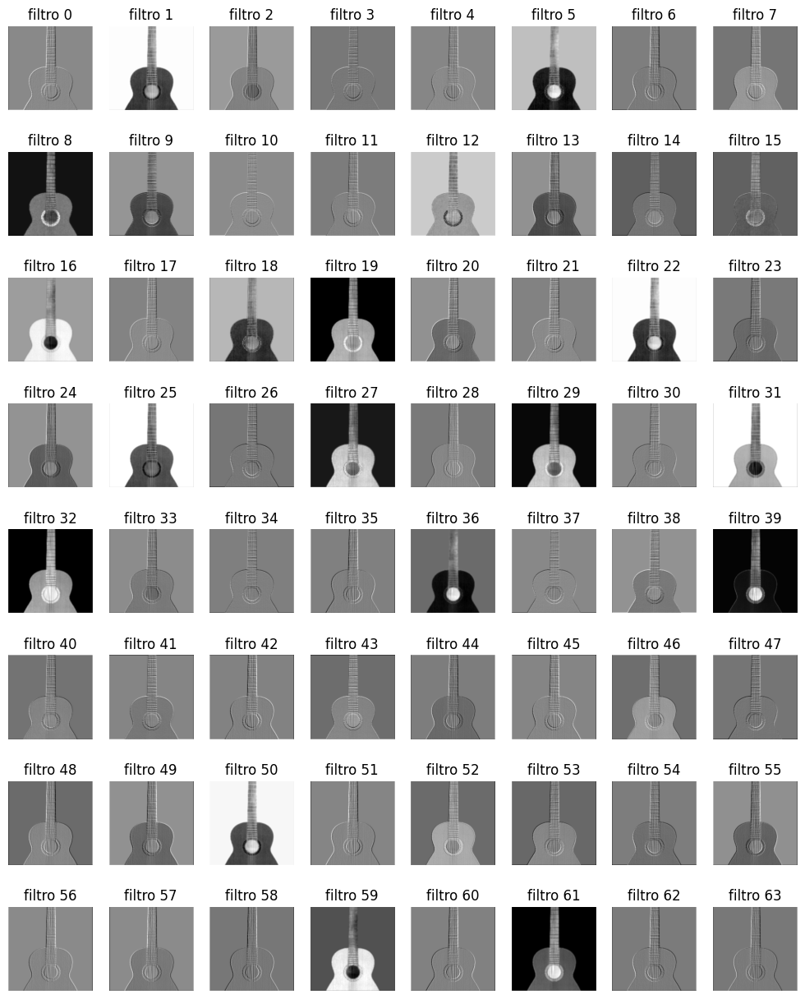

In [ ]:
fig, axs = plt.subplots(8, 8)

cont = 0
for i in range(8):
  for j in range(8):
    filter_output = layer_1.convolution_op(inputs=img4, kernel=layer_1.get_weights()[0])[0][:, :, cont]
    axs[i, j].imshow(filter_output, cmap='gray') #Filtro para esacala de grises
    axs[i, j].set_title("filtro "+str( cont))
    axs[i, j].axis('off')
    cont += 1

plt.subplots_adjust(left=0.1, right=0.9, top=1.1, bottom=0.1, wspace=0.2, hspace=0.2)

fig.set_size_inches(12, 12)
plt.show()


In [ ]:
print(model1.layers[1].input)
print(model1.layers[1].output)

KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_3'), name='input_3', description="created by layer 'input_3'")
KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 64), dtype=tf.float32, name=None), name='block1_conv1/Relu:0', description="created by layer 'block1_conv1'")


In [ ]:
#La salida de la convolucion
layer_1conv.shape

TensorShape([224, 224, 64])

# **Punto C: La segunda capa de convolución.**
---

In [ ]:
#Teniendo en cuenta la imagen y la información
model1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
#Obtenemos la segunda capa del modelo
layer_2 = model1.layers[2]

In [ ]:
'''
Esto nos indica que se aplicara un filtro de alto 64 con
una anchura de 3
'''
layer_2.weights[0][0][:, :, 0].shape

TensorShape([3, 64])

<h3><b>¿Que entra y que sale?</b></h3>
<p align='Justify'>
Como dijimos anteriormente, es importante saber cual es el imput para la capa 2. Tuvimos bastantes problemas por desconocer esta parte, asi que para modo de guia decidimos imprimir lo que necesita la segunda capa para realizar la convolución.
</p>

In [ ]:
print(model1.layers[2].input)
print(model1.layers[2].output)

KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 64), dtype=tf.float32, name=None), name='block1_conv1/Relu:0', description="created by layer 'block1_conv1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 64), dtype=tf.float32, name=None), name='block1_conv2/Relu:0', description="created by layer 'block1_conv2'")


<p align='Justify'>En una operación de convolución en una CNN, generalmente se espera que la entrada tenga las siguientes dimensiones: [batch_size, height, width, channels]. Cada dimensión representa lo siguiente:</p>
<ul>
<li><b>batch_size:</b> el tamaño del lote, es decir, el número de ejemplos de entrenamiento procesados simultáneamente.</li>
<li><b>height:</b> la altura de la imagen de entrada.
<li><b>width:</b> el ancho de la imagen de entrada.</li>
<li><b>channels:</b> el número de canales o características en la imagen de entrada.</li>
</ul>

In [ ]:
tensor_modificado = tf.reshape(layer_1conv, [1, 224, 224, 64])

In [ ]:
layer_2.get_weights()[0].shape

(3, 3, 64, 64)

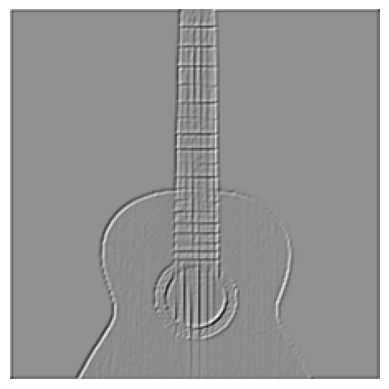

In [ ]:
#Se envian los pesos de la primera capa
aconv = layer_2.convolution_op(inputs=tensor_modificado, kernel=layer_2.get_weights()[0])[0]
plt.imshow(aconv[:, :, 0], cmap='gray')
plt.axis('off')
plt.show()

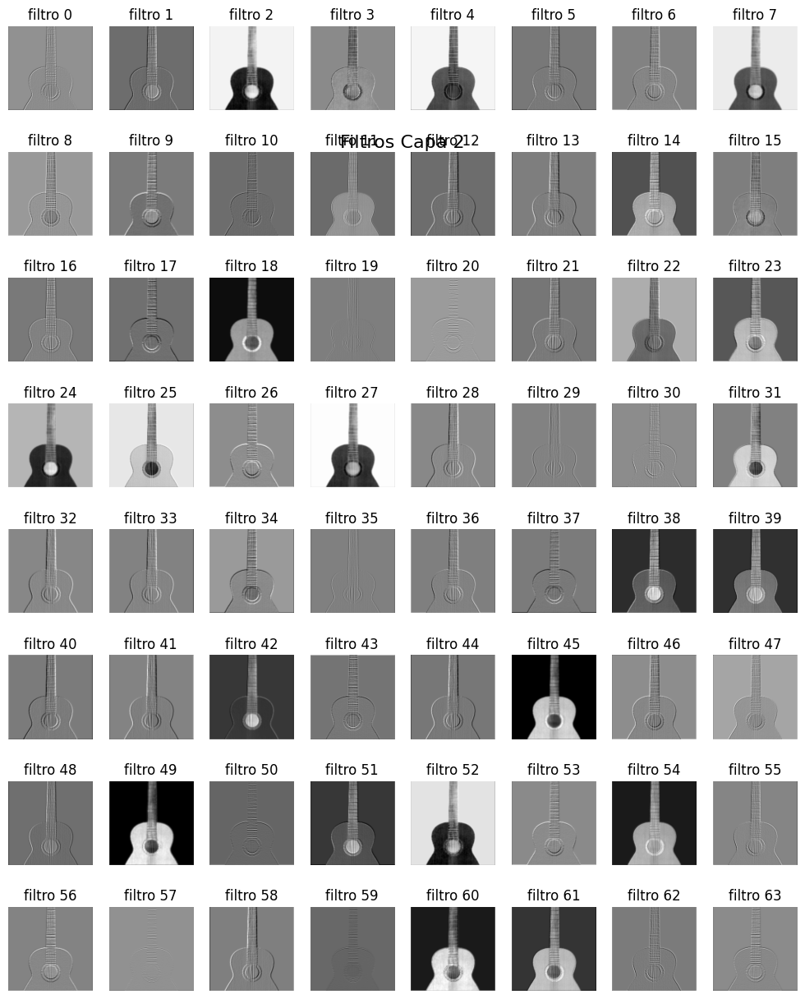

In [ ]:
fig, axs = plt.subplots(8, 8)

cont = 0
for i in range(8):
  for j in range(8):
    filter_output = layer_2.convolution_op(inputs=tensor_modificado, kernel=layer_2.get_weights()[0])[0][:, :, cont]
    axs[i, j].imshow(filter_output, cmap='gray') #Filtro para esacala de grises
    axs[i, j].set_title("filtro "+str( cont))
    axs[i, j].axis('off')
    cont += 1

plt.subplots_adjust(left=0.1, right=0.9, top=1.1, bottom=0.1, wspace=0.2, hspace=0.2)

fig.set_size_inches(12, 12)
plt.show()

# **Punto D: Aplicar MaxPooling.**
---

In [ ]:
tensor_modificado2 = tf.reshape(aconv, [1, 224, 224, 64])

In [ ]:
pooling_layer = MaxPooling2D(2,2)(tensor_modificado2)[0]

In [ ]:
pooling_layer.shape

TensorShape([112, 112, 64])

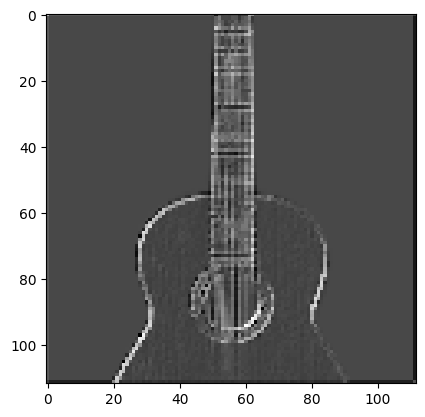

In [ ]:
plt.imshow(pooling_layer[:,:,0], cmap='gray')
plt.show()

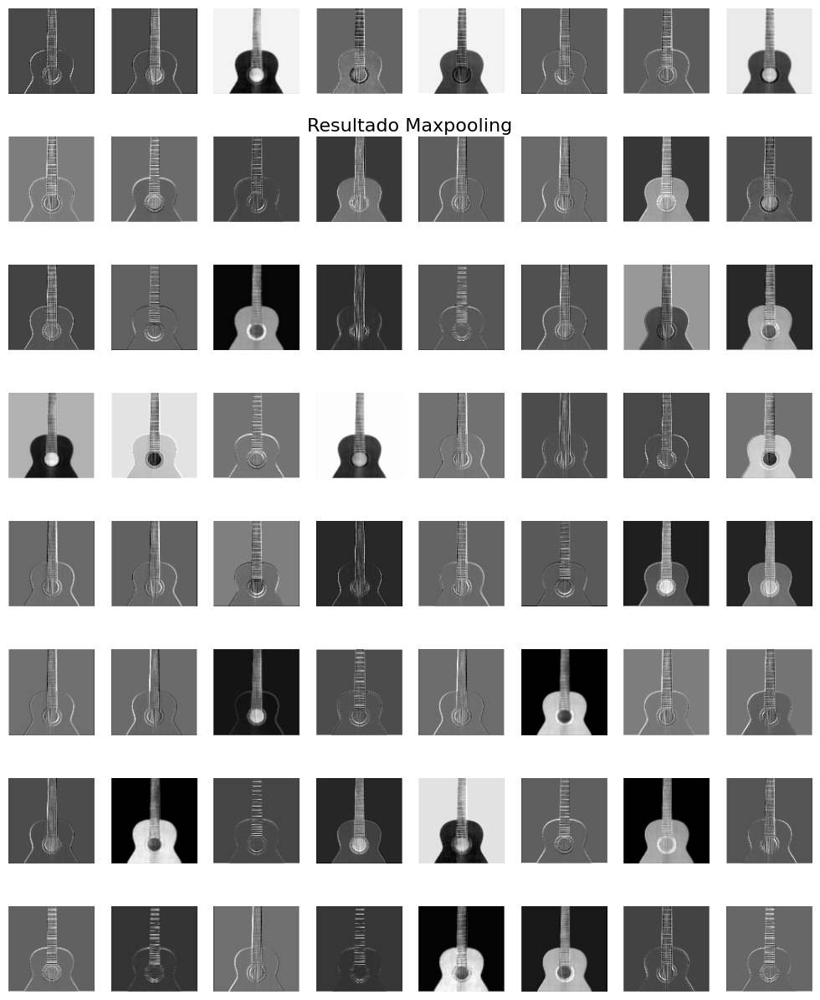

In [ ]:
fig, axs = plt.subplots(8, 8)

cont = 0
for i in range(8):
  for j in range(8):
    axs[i, j].imshow(pooling_layer[:, :, cont], cmap='gray') #Filtro para esacala de grises
    axs[i, j].axis('off')
    cont += 1

fig.set_size_inches(12, 12)
plt.subplots_adjust(left=0.1, right=0.9, top=1.1, bottom=0.1, wspace=0.2, hspace=0.2)
fig.suptitle("Resultado Maxpooling", fontsize=16)

plt.show()

# **Punto E: Corroborar con numpy.**
---

In [ ]:
#Tres canales y una mascara 3x3
layer_1.get_weights()[0].shape

(3, 3, 3, 64)

In [ ]:
#Se obtiene la mascara del filtro
'''
Lista    Canal       Filtro
[0]     [0,1,2]    [:, :, 0]
'''
filtroR = layer_1.get_weights()[0][0][:, :, 1]
filtroG = layer_1.get_weights()[0][1][:, :, 1]
filtroB = layer_1.get_weights()[0][2][:, :, 1]

In [ ]:
print("Mascara para el canal R\n", filtroR)
print("Mascara para el canal G\n", filtroG)
print("Mascara para el canal B\n", filtroB)

Mascara para el canal R
 [[ 0.11727387  0.02087744 -0.17269668]
 [ 0.16206263  0.04734124 -0.17037505]
 [ 0.135694    0.04185439 -0.15435153]]
Mascara para el canal G
 [[ 0.14835016  0.03104937 -0.18760149]
 [ 0.20229845  0.06581022 -0.17757156]
 [ 0.16168842  0.0462575  -0.17439997]]
Mascara para el canal B
 [[ 0.12934428  0.03167877 -0.16600266]
 [ 0.17157242  0.05471011 -0.16666673]
 [ 0.13871045  0.04231958 -0.1570488 ]]


In [ ]:
def aplicar_filtro(imagen, filtro):
  filas, columnas = imagen.shape
  imagen_filtrada = []
  for i in range(1, filas - 1):
    fila=[]
    for j in range(1, columnas - 1):
      porcion = imagen[i-1:i+2, j-1:j+2]
      fila.append(np.multiply(porcion, filtro).sum())
    imagen_filtrada.append(fila)
  return np.asarray(imagen_filtrada)

In [ ]:
#Se aplica el filtro correspondiente a cada canal de la imagen original
resutlR = aplicar_filtro(img4[0][:,:,0], filtroR)
resutlG = aplicar_filtro(img4[0][:,:,1], filtroG)
resutlB = aplicar_filtro(img4[0][:,:,2], filtroB)

In [ ]:
imgray = resutlR + resutlG + resutlB

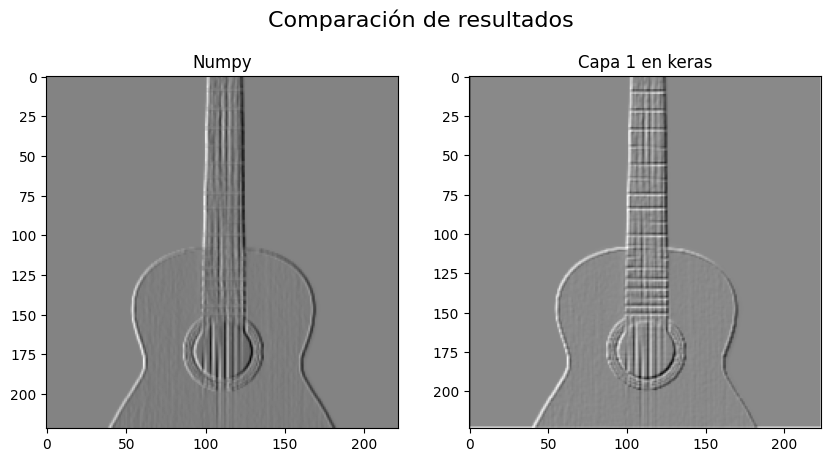

In [ ]:
fig, axs = plt.subplots(1, 2)

axs[0].imshow(imgray, cmap='gray')
axs[0].set_title('Numpy')

axs[1].imshow(layer_1conv[:, :, 0], cmap='gray')
axs[1].set_title('Capa 1 en keras')

fig.set_size_inches(10, 5)
fig.suptitle("Comparación de resultados", fontsize=16)

plt.show()

# **SEGUNDA PARTE**

## **Red neuronal usando Keras**

In [ ]:
#Se importa el dataset
from sklearn.datasets import load_diabetes
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
diabetes = load_diabetes()
print(diabetes.DESCR)

.. _diabetes_dataset:

Diabetes dataset
----------------

Ten baseline variables, age, sex, body mass index, average blood
pressure, and six blood serum measurements were obtained for each of n =
442 diabetes patients, as well as the response of interest, a
quantitative measure of disease progression one year after baseline.

**Data Set Characteristics:**

  :Number of Instances: 442

  :Number of Attributes: First 10 columns are numeric predictive values

  :Target: Column 11 is a quantitative measure of disease progression one year after baseline

  :Attribute Information:
      - age     age in years
      - sex
      - bmi     body mass index
      - bp      average blood pressure
      - s1      tc, total serum cholesterol
      - s2      ldl, low-density lipoproteins
      - s3      hdl, high-density lipoproteins
      - s4      tch, total cholesterol / HDL
      - s5      ltg, possibly log of serum triglycerides level
      - s6      glu, blood sugar level

Note: Each of these 1

In [ ]:
#Hacemos escalado de los datos
scaler = StandardScaler()

In [ ]:
X = scaler.fit_transform(diabetes.data)
y = scaler.fit_transform(diabetes.target.reshape(-1, 1))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
modelo = keras.models.Sequential()
modelo.add(keras.layers.Input(shape=10)) #10 caracteristicas
modelo.add(keras.layers.Dense(10, activation='sigmoid', name= 'hidden_1'))
modelo.add(keras.layers.Dense(10, activation='sigmoid', name= 'hidden_2'))
modelo.add(keras.layers.Dense(1, activation='sigmoid'))

In [ ]:
modelo.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden_1 (Dense)            (None, 10)                110       
                                                                 
 hidden_2 (Dense)            (None, 10)                110       
                                                                 
 dense_1 (Dense)             (None, 1)                 11        
                                                                 
Total params: 231
Trainable params: 231
Non-trainable params: 0
_________________________________________________________________


In [ ]:
'''
La función de pérdida de Huber es una alternativa robusta al MSE,
ya que es menos sensible a los valores atípicos en los datos.
'''
modelo.compile(optimizer='adam',
              loss=keras.losses.huber_loss,
              metrics=['mean_squared_error'])

In [ ]:
#Entrenamos el modelo
model = modelo.fit(X_train, y_train, epochs=300)

Epoch 1/300
10/10 [==============================] - 0s 2ms/step - loss: 0.3418 - mean_squared_error: 0.7150
Epoch 2/300
10/10 [==============================] - 0s 2ms/step - loss: 0.3418 - mean_squared_error: 0.7149
Epoch 3/300
10/10 [==============================] - 0s 1ms/step - loss: 0.3418 - mean_squared_error: 0.7149
Epoch 4/300
10/10 [==============================] - 0s 2ms/step - loss: 0.3417 - mean_squared_error: 0.7147
Epoch 5/300
10/10 [==============================] - 0s 1ms/step - loss: 0.3417 - mean_squared_error: 0.7147
Epoch 6/300
10/10 [==============================] - 0s 2ms/step - loss: 0.3416 - mean_squared_error: 0.7145
Epoch 7/300
10/10 [==============================] - 0s 2ms/step - loss: 0.3416 - mean_squared_error: 0.7145
Epoch 8/300
10/10 [==============================] - 0s 1ms/step - loss: 0.3415 - mean_squared_error: 0.7143
Epoch 9/300
10/10 [==============================] - 0s 2ms/step - loss: 0.3415 - mean_squared_error: 0.7143
Epoch 10/300
10/10 

In [ ]:
x = np.arange(0,300)

fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Scatter(x=x, y=model.history['loss'], mode='lines', name='Loss'), row=1, col=1)

fig.add_trace(go.Scatter(x=x, y=model.history['mean_squared_error'], mode='lines', name='MSE'), row=1, col=2)


fig.update_layout(title={'text':'Comparación LOSS y MSE','x':0.5},
                  xaxis1_title='Epoch',
                  yaxis1_title='Loss',
                  xaxis2_title='Epoch',
                  yaxis2_title='MSE', template='plotly_dark', width=1200, height=500,margin=dict(r=0, t=50))
fig.show()

<h2><b>¿Cúal es el más optimo?</b></h2>
<p align='Justify'>
Como se puede observar<b> SE UTILIZARON 300 ITERACIONES</b>, sin embargo esto parace ser mucho ya que como se puede apreciar en las graficas, a partir de la epoca o iteración 150, el modelo empieza a converger. En el caso del Loss, este converge a 0.33 y en el caso del error cuadratico medio a 0.7. Si se quiere disminuir aún mas los resultados obtenidos se podrian agregar mas capas densas en la red y configurar el numero de neuronas en cada una de ellas.
</p>

## **Desarrollar el propio código**

<p align='Justify'>Nosotros realizamos un modelo con keras, el cual tiene dos capas ocultas y en cada capa hay 10 nodos o neuronas, a exepción de la tercera capa oculta que es la que nos da la predección. Es decir: 10x10+2</p>

In [ ]:
def sigmoid(z):
  return 1 / (1 + np.exp(-z))

<b>INPUT</b>

Para hacer la prueba de que funciona el codigo a mano con los resultados de keras, utilizaremos la primera entrada de nuestro conjunto de datos.

In [ ]:
X[0]

array([ 0.80050009,  1.06548848,  1.29708846,  0.45984057, -0.92974581,
       -0.73206462, -0.91245053, -0.05449919,  0.41853093, -0.37098854])

<b>CAPA UNO</b>

In [ ]:
#Los pesos correspondientes a la primera capa
layer1_weights = modelo.layers[0].get_weights()[0]

#Sesgo o bias asociado
layer1_bias = modelo.layers[0].get_weights()[1]

In [ ]:
#Estos son los resultados de cada nodo en la capa, se procede a sacarle el sigmoid
result1 = np.dot(X[0], layer1_weights) + layer1_bias
result1

array([-1.70004009, -1.89691635, -1.13243572, -1.95091766, -2.62898124,
       -1.32869048,  2.68433576, -2.11434529,  2.103814  , -3.09066946])

Como decimos anteriormente, la primera capa de nuestro modelo tiene 10 nodos. Los valores obtenidos a continuación representan los resultados para los nodos de esta primera capa.

In [ ]:
#Sacamos el sigmoid
result1 = sigmoid(result1)
result1

array([0.15446003, 0.13045788, 0.24371188, 0.12445333, 0.06729637,
       0.20937606, 0.93609598, 0.10771033, 0.89127333, 0.04349378])

<b>CAPA DOS</b>

Es el mismo procedimiento que el de la capa uno.

In [ ]:
layer2_weights = modelo.layers[1].get_weights()[0]
layer2_bias = modelo.layers[1].get_weights()[1]

In [ ]:
#Aqui cojemos los resultados de la capa uno, como explicamos en el punto 1
result2 = np.dot(result1, layer2_weights) + layer2_bias
result2 = sigmoid(result2)
result2

array([0.29460016, 0.68114045, 0.60555655, 0.71730534, 0.60035869,
       0.72998132, 0.696314  , 0.74506922, 0.2735561 , 0.33003195])

<b>SALIDA</b>

In [ ]:
layer3_weights = modelo.layers[2].get_weights()[0]
layer3_bias = modelo.layers[2].get_weights()[1]

In [ ]:
result3 = np.dot(result2, layer3_weights) + layer3_bias
result3 = sigmoid(result3)
result3

array([0.94001475])

<b>Predicción con KERAS y resultados</b>

Nos dio igualito! :)))

In [ ]:
#Se realiza la predeccion con keras
predict = modelo.predict([list(X[0])])
predict

1/1 [==============================] - 0s 162ms/step


array([[0.94001484]], dtype=float32)

In [ ]:
print("El resultado obtenido a mano: ", result3)
print("El resultado obtenido con keras: ", predict)

El resultado obtenido a mano:  [0.94001475]
El resultado obtenido con keras:  [[0.94001484]]
